In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, cross_val_score, KFold , StratifiedKFold
from sklearn.preprocessing import LabelEncoder ,StandardScaler
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import accuracy_score, roc_curve, roc_auc_score, auc, classification_report, mean_squared_error
from itertools import cycle
from sklearn.linear_model import LogisticRegression
from sklearn.multiclass import OneVsRestClassifier
from skopt.space import Real, Categorical, Integer
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.cluster import KMeans
from sklearn.tree import DecisionTreeClassifier
 # statistics packages
from scipy.stats import skew
from scipy import stats
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax
from scipy.sparse import csr_matrix  # For efficient sparse matrix representation
from sklearn.feature_selection import chi2
from sklearn.feature_selection import SelectKBest 
from skopt import BayesSearchCV
from sklearn.pipeline import Pipeline
import warnings
warnings.filterwarnings('ignore')

In [2]:
!pip install scikit-learn scikit-optimize

In [3]:
tdf=pd.read_csv("/kaggle/input/tabular-playground-series-feb-2022/train.csv",index_col=0)

In [4]:
tdf.head()

,A0T0G0C10,A0T0G1C9,A0T0G2C8,A0T0G3C7,A0T0G4C6,A0T0G5C5,A0T0G6C4,A0T0G7C3,A0T0G8C2,A0T0G9C1,...,A8T0G1C1,A8T0G2C0,A8T1G0C1,A8T1G1C0,A8T2G0C0,A9T0G0C1,A9T0G1C0,A9T1G0C0,A10T0G0C0,target
row_id,,,,,,,,,,,,,,,,,,,,,
0,-9.536743e-07,-0.000010,-0.000043,-0.000114,-0.000200,-0.000240,-0.000200,-0.000114,-0.000043,-0.000010,...,-0.000086,-0.000043,-0.000086,-0.000086,-0.000043,-0.000010,-0.000010,-0.000010,-9.536743e-07,Streptococcus_pyogenes
1,-9.536743e-07,-0.000010,-0.000043,0.000886,-0.000200,0.000760,-0.000200,-0.000114,-0.000043,-0.000010,...,-0.000086,-0.000043,0.000914,0.000914,-0.000043,-0.000010,-0.000010,-0.000010,-9.536743e-07,Salmonella_enterica
2,-9.536743e-07,-0.000002,0.000007,0.000129,0.000268,0.000270,0.000243,0.000125,0.000001,-0.000007,...,0.000084,0.000048,0.000081,0.000106,0.000072,0.000010,0.000008,0.000019,1.046326e-06,Salmonella_enterica
3,4.632568e-08,-0.000006,0.000012,0.000245,0.000492,0.000522,0.000396,0.000197,-0.000003,-0.000007,...,0.000151,0.000100,0.000180,0.000202,0.000153,0.000021,0.000015,0.000046,-9.536743e-07,Salmonella_enterica
4,-9.536743e-07,-0.000010,-0.000043,-0.000114,-0.000200,-0.000240,-0.000200,-0.000114,-0.000043,-0.000010,...,-0.000086,-0.000043,-0.000086,-0.000086,-0.000043,-0.000010,-0.000010,-0.000010,-9.536743e-07,Enterococcus_hirae


In [5]:
tdf.columns

Index(['A0T0G0C10', 'A0T0G1C9', 'A0T0G2C8', 'A0T0G3C7', 'A0T0G4C6', 'A0T0G5C5',
       'A0T0G6C4', 'A0T0G7C3', 'A0T0G8C2', 'A0T0G9C1',
       ...
       'A8T0G1C1', 'A8T0G2C0', 'A8T1G0C1', 'A8T1G1C0', 'A8T2G0C0', 'A9T0G0C1',
       'A9T0G1C0', 'A9T1G0C0', 'A10T0G0C0', 'target'],
      dtype='object', length=287)

In [6]:
tdf.info()

<class 'pandas.core.frame.DataFrame'>
Index: 200000 entries, 0 to 199999
Columns: 287 entries, A0T0G0C10 to target
dtypes: float64(286), object(1)
memory usage: 439.5+ MB


In [7]:
tdf.shape

(200000, 287)

In [8]:
tdf.isna().sum()

A0T0G0C10    0
A0T0G1C9     0
A0T0G2C8     0
A0T0G3C7     0
A0T0G4C6     0
            ..
A9T0G0C1     0
A9T0G1C0     0
A9T1G0C0     0
A10T0G0C0    0
target       0
Length: 287, dtype: int64

In [9]:
tdf.isna().sum().sum()

0

In [10]:
tdf.duplicated()

row_id
0         False
1         False
2         False
3         False
4         False
          ...  
199995    False
199996     True
199997    False
199998     True
199999     True
Length: 200000, dtype: bool

In [11]:
tdf.duplicated().sum()

76007

In [12]:
tdf=tdf.drop_duplicates()

In [13]:
tdf.shape

(123993, 287)

In [14]:
tsdf=pd.read_csv("/kaggle/input/tabular-playground-series-feb-2022/test.csv",index_col=0)

In [15]:
tsdf.head()

,A0T0G0C10,A0T0G1C9,A0T0G2C8,A0T0G3C7,A0T0G4C6,A0T0G5C5,A0T0G6C4,A0T0G7C3,A0T0G8C2,A0T0G9C1,...,A8T0G0C2,A8T0G1C1,A8T0G2C0,A8T1G0C1,A8T1G1C0,A8T2G0C0,A9T0G0C1,A9T0G1C0,A9T1G0C0,A10T0G0C0
row_id,,,,,,,,,,,,,,,,,,,,,
200000,-9.536743e-07,-0.000002,-9.153442e-07,0.000024,0.000034,-0.000002,0.000021,0.000024,-0.000009,-0.000008,...,0.000039,0.000085,0.000055,0.000108,0.000090,0.000059,0.000010,0.000006,0.000027,4.632568e-08
200001,-9.536743e-07,-0.000010,-4.291534e-05,-0.000114,0.001800,-0.000240,0.001800,-0.000114,0.000957,-0.000010,...,-0.000043,0.000914,-0.000043,-0.000086,-0.000086,-0.000043,-0.000010,-0.000010,-0.000010,-9.536743e-07
200002,4.632568e-08,0.000003,8.465576e-08,-0.000014,0.000007,-0.000005,-0.000004,0.000003,0.000004,-0.000008,...,0.000041,0.000102,0.000084,0.000111,0.000117,0.000070,0.000020,0.000030,0.000021,4.632568e-08
200003,-9.536743e-07,-0.000008,8.084656e-06,0.000216,0.000420,0.000514,0.000452,0.000187,-0.000005,-0.000008,...,0.000069,0.000158,0.000098,0.000175,0.000217,0.000150,0.000018,0.000016,0.000051,-9.536743e-07
200004,-9.536743e-07,-0.000010,-4.291534e-05,-0.000114,-0.000200,-0.000240,-0.000200,-0.000114,-0.000043,-0.000010,...,-0.000043,-0.000086,-0.000043,-0.000086,0.000914,-0.000043,-0.000010,-0.000010,0.000990,-9.536743e-07


In [16]:
tsdf.info()

<class 'pandas.core.frame.DataFrame'>
Index: 100000 entries, 200000 to 299999
Columns: 286 entries, A0T0G0C10 to A10T0G0C0
dtypes: float64(286)
memory usage: 219.0 MB


In [17]:
tsdf.shape

(100000, 286)

In [18]:
tdf.groupby('target').describe()

A0T0G0C10                                            \
                             count          mean           std           min   
target                                                                         
Bacteroides_fragilis       12522.0 -1.883812e-07  1.554267e-05 -9.536743e-07   
Campylobacter_jejuni       12469.0  7.800115e-06  2.029455e-04 -9.536743e-07   
Enterococcus_hirae         12373.0 -8.667108e-07  2.817930e-07 -9.536743e-07   
Escherichia_coli           12297.0 -4.857553e-07  1.563834e-05 -9.536743e-07   
Escherichia_fergusonii     12285.0 -1.820015e-07  1.569266e-05 -9.536743e-07   
Klebsiella_pneumoniae      12420.0 -2.205825e-07  1.559990e-05 -9.536743e-07   
Salmonella_enterica        12390.0 -4.640859e-07  1.558522e-05 -9.536743e-07   
Staphylococcus_aureus      12415.0 -8.633803e-07  2.866140e-07 -9.536743e-07   
Streptococcus_pneumoniae   12416.0 -8.641930e-07  2.854487e-07 -9.536743e-07   
Streptococcus_pyogenes     12406.0 -8.637178e-07  2.861309e-07 -9.536743e-07   

                                                                    \
                                   25%           50%           75%   
target                                                               
Bacteroides_fragilis     -9.536743e-07 -9.536743e-07  4.632568e-08   
Campylobacter_jejuni     -9.536743e-07  4.632568e-08  6.046326e-06   
Enterococcus_hirae       -9.536743e-07 -9.536743e-07 -9.536743e-07   
Escherichia_coli         -9.536743e-07 -9.536743e-07 -9.536743e-07   
Escherichia_fergusonii   -9.536743e-07 -9.536743e-07  4.632568e-08   
Klebsiella_pneumoniae    -9.536743e-07 -9.536743e-07  4.632568e-08   
Salmonella_enterica      -9.536743e-07 -9.536743e-07 -9.536743e-07   
Staphylococcus_aureus    -9.536743e-07 -9.536743e-07 -9.536743e-07   
Streptococcus_pneumoniae -9.536743e-07 -9.536743e-07 -9.536743e-07   
Streptococcus_pyogenes   -9.536743e-07 -9.536743e-07 -9.536743e-07   

                                       A0T0G1C9            ...  A9T1G0C0  \
                                   max    count      mean  ...       75%   
target                                                     ...             
Bacteroides_fragilis      9.990463e-04  12522.0 -0.000003  ...  0.000084   
Campylobacter_jejuni      9.999046e-03  12469.0 -0.000002  ...  0.000422   
Enterococcus_hirae        4.632568e-08  12373.0 -0.000004  ...  0.000290   
Escherichia_coli          9.990463e-04  12297.0 -0.000004  ...  0.000036   
Escherichia_fergusonii    9.990463e-04  12285.0 -0.000004  ...  0.000041   
Klebsiella_pneumoniae     9.990463e-04  12420.0  0.000005  ...  0.000030   
Salmonella_enterica       9.990463e-04  12390.0 -0.000002  ...  0.000043   
Staphylococcus_aureus     4.632568e-08  12415.0 -0.000004  ...  0.000150   
Streptococcus_pneumoniae  4.632568e-08  12416.0 -0.000004  ...  0.000095   
Streptococcus_pyogenes    4.632568e-08  12406.0 -0.000004  ...  0.000110   

                                  A10T0G0C0                              \
                              max     count          mean           std   
target                                                                    
Bacteroides_fragilis      0.00999   12522.0 -1.530035e-07  1.829408e-06   
Campylobacter_jejuni      0.01999   12469.0 -2.601945e-07  1.553569e-06   
Enterococcus_hirae        0.00999   12373.0  4.707604e-06  3.731076e-05   
Escherichia_coli          0.00999   12297.0 -7.334580e-07  4.144093e-07   
Escherichia_fergusonii    0.00999   12285.0 -7.303125e-07  4.165158e-07   
Klebsiella_pneumoniae     0.00999   12420.0 -6.615648e-07  7.149619e-07   
Salmonella_enterica       0.00999   12390.0 -3.409221e-07  1.468588e-06   
Staphylococcus_aureus     0.00999   12415.0 -7.287045e-07  4.175793e-07   
Streptococcus_pneumoniae  0.00999   12416.0  2.949596e-06  2.722328e-05   
Streptococcus_pyogenes    0.00999   12406.0 -3.007644e-07  1.613012e-06   

                                                                    \
                                   min

In [19]:
tdf['target'].value_counts()

target
Bacteroides_fragilis        12522
Campylobacter_jejuni        12469
Klebsiella_pneumoniae       12420
Streptococcus_pneumoniae    12416
Staphylococcus_aureus       12415
Streptococcus_pyogenes      12406
Salmonella_enterica         12390
Enterococcus_hirae          12373
Escherichia_coli            12297
Escherichia_fergusonii      12285
Name: count, dtype: int64

In [20]:
df = pd.DataFrame(tdf['target'].value_counts()).reset_index()
df.columns = ['species', 'target']  

df['percentage'] = df['target'] / df['target'].sum() * 100

print(df)

                    species  target  percentage
0      Bacteroides_fragilis   12522   10.098957
1      Campylobacter_jejuni   12469   10.056213
2     Klebsiella_pneumoniae   12420   10.016694
3  Streptococcus_pneumoniae   12416   10.013469
4     Staphylococcus_aureus   12415   10.012662
5    Streptococcus_pyogenes   12406   10.005404
6       Salmonella_enterica   12390    9.992500
7        Enterococcus_hirae   12373    9.978789
8          Escherichia_coli   12297    9.917495
9    Escherichia_fergusonii   12285    9.907817


# Exploratory Data Analysis 

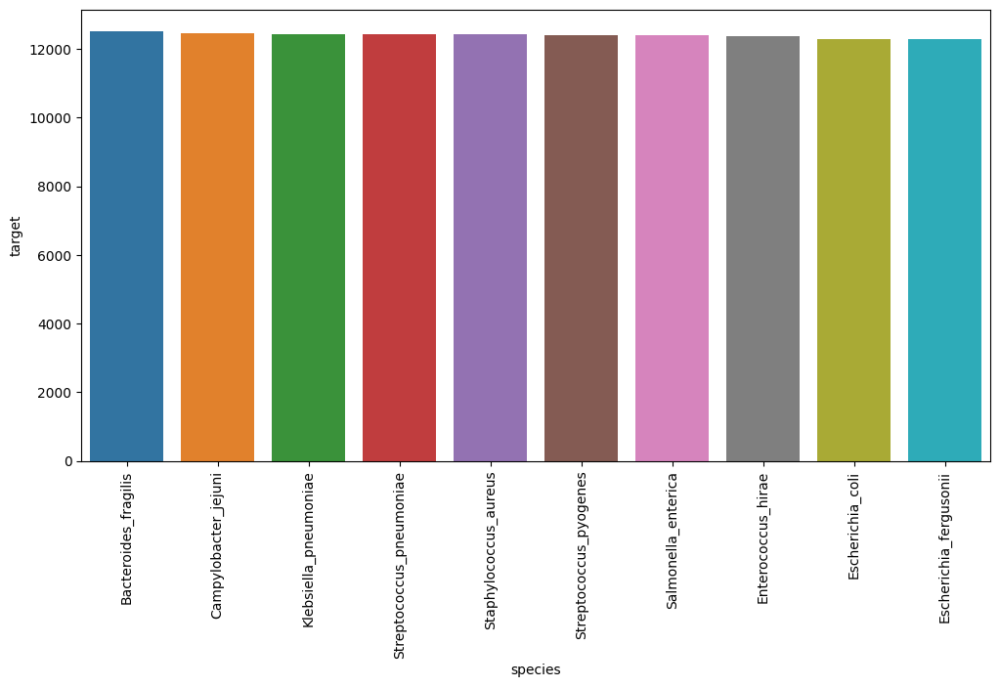

In [21]:
plt.figure(figsize=(12,6))
sns.barplot(y='target',x='species',data=df)
plt.xticks(rotation=90)
plt.show()

## Distribution of bactria species 

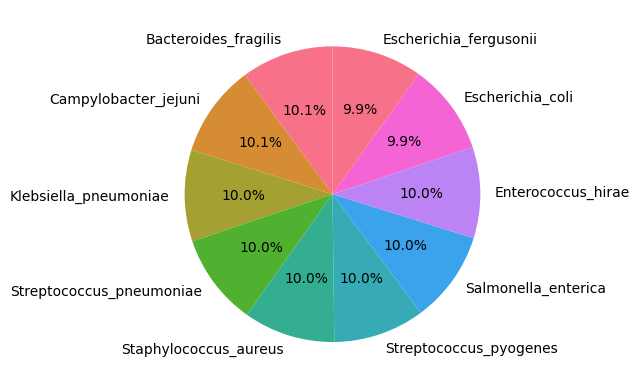

In [22]:
colors = sns.color_palette("husl", 9)
plt.pie(df['target'],labels=df['species'], colors=colors, startangle=90, autopct='%1.1f%%')
plt.show()

# Correlation between genes 

In [23]:
tdf_encoded = pd.get_dummies(tdf)

corr = tdf_encoded.corr()



In [24]:
corr.style.background_gradient(cmap='cividis')

## Most correlated Gene Pairs 
##### Below is a list of the gene pairs that have an absolute correlation above 0.75.

In [25]:
c = corr.abs().unstack().drop_duplicates().reset_index()
c = c.rename(columns={'level_0': 'Gene 1', 'level_1': 'Gene 2', 0: 'Correlation'})
c = c.query('.75 <= Correlation < 1').sort_values(by = 'Correlation', ascending = False).reset_index(drop=True)
c.style.background_gradient(cmap='flare_r')

,Gene 1,Gene 2,Correlation
0,A3T0G3C4,A3T1G3C3,0.841147
1,A4T0G1C5,A4T1G4C1,0.836729
2,A1T2G6C1,A1T2G7C0,0.826939
3,A3T0G3C4,A3T0G5C2,0.808522
4,A1T2G4C3,A2T1G3C4,0.798469
5,A5T4G0C1,A5T5G0C0,0.797656
6,A3T0G5C2,A3T1G3C3,0.796709
7,A1T2G3C4,A2T1G3C4,0.790639
8,A2T2G2C4,A2T2G4C2,0.788767
9,A4T0G1C5,A5T0G2C3,0.778885


# Most correlated Gene in each Species 

In [26]:
tdf_encoded = pd.get_dummies(tdf)

for i in tdf['target'].unique():
    corr_df = tdf_encoded[tdf['target'] == i]

    corr = corr_df.corr()

    c = corr.abs().unstack().drop_duplicates().reset_index()
    c = c.rename(columns={'level_0': 'Gene 1', 'level_1': 'Gene 2', 0: 'Correlation'})
    c = c.query('Correlation < 1').sort_values(by='Correlation', ascending=False).reset_index(drop=True)

    display(c.iloc[:1, :].style.background_gradient(cmap='flare').set_caption('Most correlated genes in {}'.format(i.replace('_', ' '))))

,Gene 1,Gene 2,Correlation
0,A0T0G5C5,A0T0G7C3,0.981113


,Gene 1,Gene 2,Correlation
0,A5T4G0C1,A5T5G0C0,0.916334


,Gene 1,Gene 2,Correlation
0,A0T0G5C5,A0T0G7C3,0.980968


,Gene 1,Gene 2,Correlation
0,A5T4G0C1,A5T5G0C0,0.904267


,Gene 1,Gene 2,Correlation
0,A0T0G4C6,A0T0G6C4,0.994300


,Gene 1,Gene 2,Correlation
0,A0T0G8C2,A1T0G0C9,0.995343


,Gene 1,Gene 2,Correlation
0,A0T0G3C7,A0T1G1C8,0.991636


,Gene 1,Gene 2,Correlation
0,A5T4G0C1,A5T5G0C0,0.916947


,Gene 1,Gene 2,Correlation
0,A1T2G6C1,A1T2G7C0,0.870281


,Gene 1,Gene 2,Correlation
0,A5T4G0C1,A5T5G0C0,0.956983


### Below is a list of the highest 10 oligomer pairs correlated per species.

In [27]:
for i in tdf['target'].unique():
    cor_df = tdf[tdf['target'] == i]

    numerical_columns = cor_df.select_dtypes(include=['number']).columns
    cor_df_numerical = cor_df[numerical_columns]

    cor = cor_df_numerical.corr()

    c = cor.abs().unstack().drop_duplicates().reset_index()
    c = c.rename(columns={'level_0': 'Oligomer 1', 'level_1': 'Oligomer 2', 0: 'Correlation'})
    c = c.query('0.75 <= Correlation < 1').sort_values(by='Correlation', ascending=False).reset_index(drop=True)

    display(c.iloc[:10, :].style.background_gradient(cmap='plasma').set_caption('Strongest oligomer correlation: {}'.format(i.replace('_', ' '))))

,Oligomer 1,Oligomer 2,Correlation
0,A0T0G5C5,A0T0G7C3,0.981113
1,A0T0G5C5,A0T1G1C8,0.980433
2,A0T0G7C3,A0T1G1C8,0.972056
3,A0T0G6C4,A1T0G5C4,0.963176
4,A0T0G4C6,A0T0G6C4,0.960012
5,A0T0G6C4,A0T0G7C3,0.959965
6,A0T0G6C4,A0T1G6C3,0.957442
7,A0T0G7C3,A0T1G6C3,0.953419
8,A0T1G1C8,A1T0G5C4,0.953183
9,A0T0G7C3,A1T0G5C4,0.949832


,Oligomer 1,Oligomer 2,Correlation
0,A5T4G0C1,A5T5G0C0,0.916334
1,A4T4G1C1,A5T0G2C3,0.883507
2,A3T4G3C0,A4T0G1C5,0.880559
3,A5T3G0C2,A5T5G0C0,0.876061
4,A5T0G2C3,A5T5G0C0,0.850378
5,A5T2G3C0,A5T5G0C0,0.849775
6,A4T0G1C5,A4T1G4C1,0.840070
7,A5T3G0C2,A5T4G0C1,0.838710
8,A3T4G3C0,A4T1G4C1,0.832868
9,A5T2G3C0,A5T4G0C1,0.823300


,Oligomer 1,Oligomer 2,Correlation
0,A0T0G5C5,A0T0G7C3,0.980968
1,A0T0G8C2,A1T0G0C9,0.970188
2,A0T0G5C5,A0T1G3C6,0.963262
3,A0T0G1C9,A0T0G5C5,0.958948
4,A0T0G6C4,A0T0G7C3,0.958417
5,A0T0G7C3,A0T1G3C6,0.954222
6,A0T0G4C6,A0T0G6C4,0.952755
7,A0T0G7C3,A0T1G7C2,0.951755
8,A0T0G5C5,A0T1G7C2,0.950764
9,A3T0G3C4,A3T0G5C2,0.944553


,Oligomer 1,Oligomer 2,Correlation
0,A5T4G0C1,A5T5G0C0,0.904267
1,A5T3G0C2,A5T5G0C0,0.878857
2,A5T2G3C0,A5T5G0C0,0.862147
3,A4T4G1C1,A5T0G2C3,0.854780
4,A3T4G3C0,A4T1G4C1,0.854032
5,A5T0G2C3,A5T5G0C0,0.848432
6,A3T4G3C0,A4T0G1C5,0.829864
7,A3T4G3C0,A4T3G2C1,0.826269
8,A5T3G0C2,A5T4G0C1,0.824592
9,A4T4G1C1,A5T5G0C0,0.819823


,Oligomer 1,Oligomer 2,Correlation
0,A0T0G4C6,A0T0G6C4,0.994300
1,A0T0G3C7,A0T0G5C5,0.991872
2,A0T0G4C6,A1T0G5C4,0.990411
3,A0T0G3C7,A0T1G8C1,0.989749
4,A0T0G2C8,A0T0G7C3,0.989475
5,A0T0G5C5,A0T1G8C1,0.989145
6,A0T1G4C5,A1T0G5C4,0.987177
7,A0T1G3C6,A0T1G4C5,0.985951
8,A0T1G3C6,A1T0G5C4,0.985858
9,A0T0G5C5,A0T1G3C6,0.984055


,Oligomer 1,Oligomer 2,Correlation
0,A0T0G8C2,A1T0G0C9,0.995343
1,A0T0G2C8,A0T0G7C3,0.990913
2,A0T0G5C5,A0T1G8C1,0.983138
3,A0T0G5C5,A0T0G7C3,0.980339
4,A0T0G7C3,A1T0G2C7,0.975143
5,A0T0G2C8,A0T0G5C5,0.974446
6,A0T0G6C4,A1T0G2C7,0.972514
7,A0T0G5C5,A1T0G2C7,0.970136
8,A0T0G2C8,A1T0G2C7,0.966608
9,A0T0G5C5,A0T1G3C6,0.966330


,Oligomer 1,Oligomer 2,Correlation
0,A0T0G3C7,A0T1G1C8,0.991636
1,A0T0G8C2,A1T0G0C9,0.985847
2,A1T0G5C4,A1T1G8C0,0.982484
3,A1T0G3C6,A1T0G5C4,0.979763
4,A0T0G7C3,A0T1G1C8,0.979002
5,A0T0G6C4,A0T1G6C3,0.977503
6,A0T1G1C8,A1T0G3C6,0.976998
7,A1T0G3C6,A1T1G8C0,0.976606
8,A0T1G6C3,A1T0G5C4,0.976515
9,A0T1G6C3,A1T0G3C6,0.976507


,Oligomer 1,Oligomer 2,Correlation
0,A5T4G0C1,A5T5G0C0,0.916947
1,A1T0G0C9,A10T0G0C0,0.889570
2,A5T0G2C3,A5T5G0C0,0.863022
3,A5T3G0C2,A5T5G0C0,0.862381
4,A4T4G1C1,A5T0G2C3,0.859826
5,A5T2G3C0,A5T5G0C0,0.853642
6,A3T4G3C0,A4T1G4C1,0.848427
7,A0T10G0C0,A1T0G0C9,0.831520
8,A5T0G2C3,A5T4G0C1,0.820559
9,A5T3G0C2,A5T4G0C1,0.819497


,Oligomer 1,Oligomer 2,Correlation
0,A1T2G6C1,A1T2G7C0,0.870281
1,A3T4G3C0,A4T0G1C5,0.856541
2,A3T0G3C4,A3T1G3C3,0.822918
3,A5T0G2C3,A5T5G0C0,0.819760
4,A5T4G0C1,A5T5G0C0,0.809877
5,A3T0G3C4,A3T0G5C2,0.797221
6,A4T0G1C5,A5T0G2C3,0.790506
7,A4T0G1C5,A4T1G4C1,0.790386
8,A4T4G1C1,A5T0G2C3,0.787689
9,A4T3G2C1,A5T0G2C3,0.785406


,Oligomer 1,Oligomer 2,Correlation
0,A5T4G0C1,A5T5G0C0,0.956983
1,A5T3G0C2,A5T5G0C0,0.909700
2,A5T2G3C0,A5T5G0C0,0.901236
3,A4T4G1C1,A5T0G2C3,0.897347
4,A5T3G0C2,A5T4G0C1,0.895798
5,A3T4G3C0,A4T0G1C5,0.887094
6,A5T2G3C0,A5T4G0C1,0.886851
7,A3T4G3C0,A4T1G4C1,0.883673
8,A5T0G2C3,A5T5G0C0,0.870512
9,A4T3G2C1,A4T4G1C1,0.865305


#### Based in the descriptive statistics, different oligomer types are more strongly correlated with different bacterial species. There are some repeating oligomer genotypes (ex. A0T0G5C5 and A0T0G7C3 in *Streptococcus pyogenes* and *Enterococcus hirae*). Bacterial species are subdivided to groups with a simmilar genetic structure.


In [28]:
#Strongest Overall Oligomer Correlation
c = cor.abs().unstack().drop_duplicates().reset_index()
c = c.rename(columns={'level_0': 'Oligomer 1', 'level_1': 'Oligomer 2', 0: 'Correlation'})
c = c.query('.85 <= Correlation < 1').sort_values(by = 'Correlation', ascending = False).reset_index(drop=True)
c.style.background_gradient(cmap='plasma')

,Oligomer 1,Oligomer 2,Correlation
0,A5T4G0C1,A5T5G0C0,0.956983
1,A5T3G0C2,A5T5G0C0,0.909700
2,A5T2G3C0,A5T5G0C0,0.901236
3,A4T4G1C1,A5T0G2C3,0.897347
4,A5T3G0C2,A5T4G0C1,0.895798
5,A3T4G3C0,A4T0G1C5,0.887094
6,A5T2G3C0,A5T4G0C1,0.886851
7,A3T4G3C0,A4T1G4C1,0.883673
8,A5T0G2C3,A5T5G0C0,0.870512
9,A4T3G2C1,A4T4G1C1,0.865305


###  Species Type vs. Oligomer Frequency

Text(0, 0.5, 'Bacterial Species')

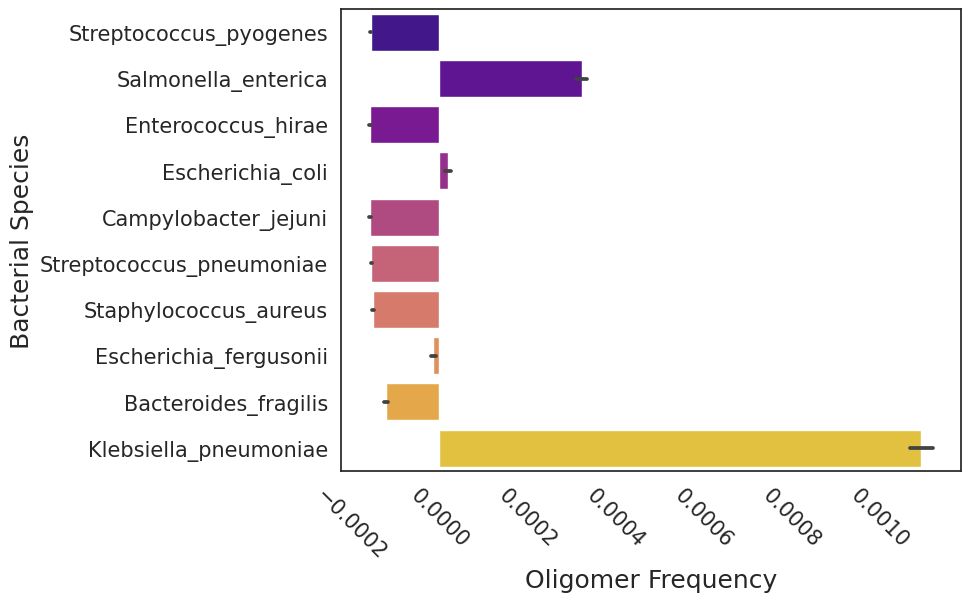

In [29]:
# A0T0G5C5 bacterial species composition
sns.set_context("notebook", font_scale=1.5)
sns.set_style("white")
sns.set_color_codes(palette='deep')
f, ax = plt.subplots(figsize=(8, 6))
sns.barplot(x = "A0T0G5C5", y = "target", palette= 'plasma', data = tdf)
plt.tick_params(axis='x', labelsize=15, rotation=-45)
plt.tick_params(axis='y', labelsize=15, rotation=0)
plt.xlabel("Oligomer Frequency")
plt.ylabel("Bacterial Species")

Text(0, 0.5, 'Bacterial Species')

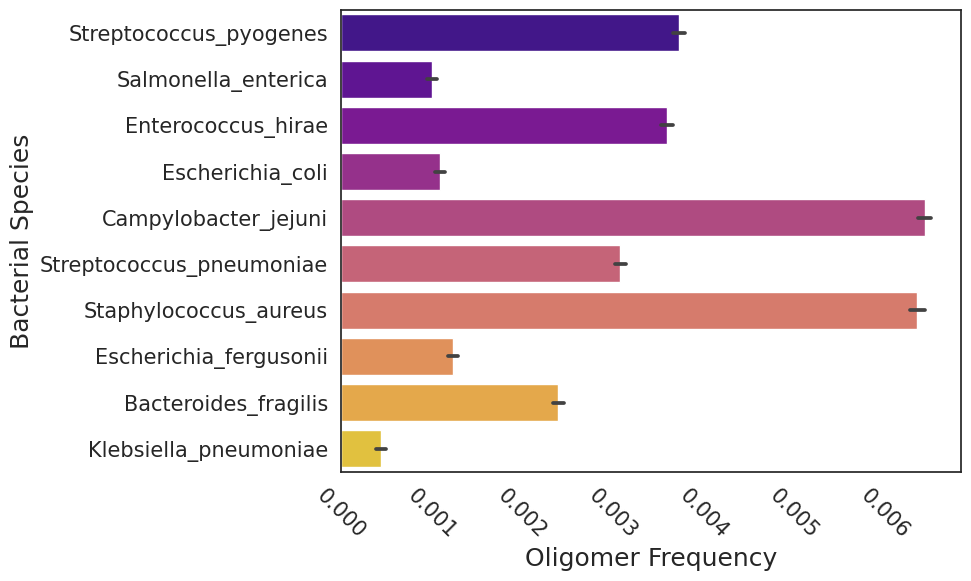

In [30]:
# A5T3G0C2 bacterial species composition
sns.set_context("notebook", font_scale=1.5)
sns.set_style("white")
sns.set_color_codes(palette='deep')
f, ax = plt.subplots(figsize=(8, 6))
sns.barplot(x = "A5T3G0C2", y = "target", palette= 'plasma', data = tdf)
plt.tick_params(axis='x', labelsize=15, rotation=-45)
plt.tick_params(axis='y', labelsize=15, rotation=0)
plt.xlabel("Oligomer Frequency")
plt.ylabel("Bacterial Species")

Text(0, 0.5, 'Bacterial Species')

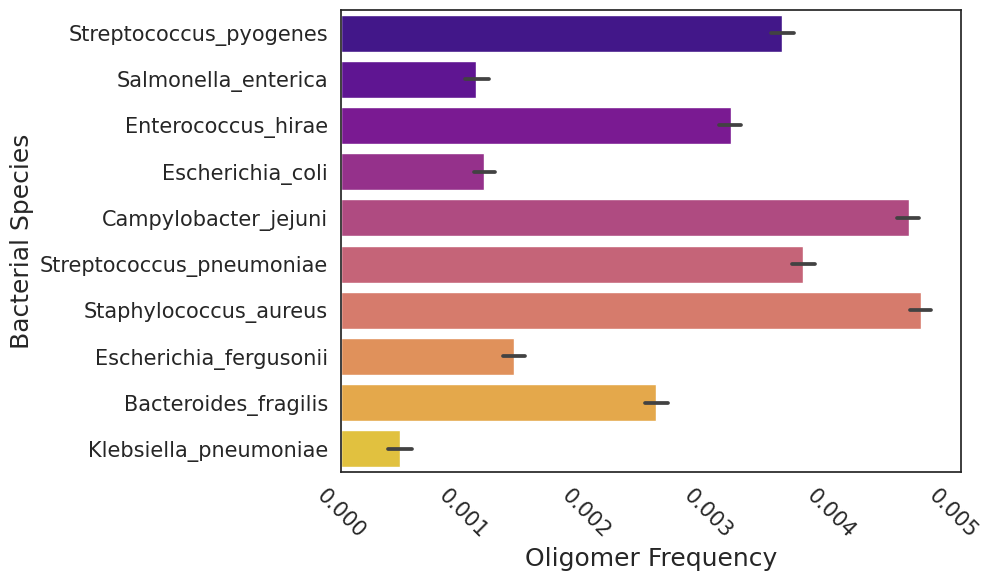

In [31]:
# A3T4G3C0 bacterial species composition
sns.set_context("notebook", font_scale=1.5)
sns.set_style("white")
sns.set_color_codes(palette='deep')
f, ax = plt.subplots(figsize=(8, 6))
sns.barplot(x = "A3T4G3C0", y = "target", palette= 'plasma', data = tdf)
plt.tick_params(axis='x', labelsize=15, rotation=-45)
plt.tick_params(axis='y', labelsize=15, rotation=0)
plt.xlabel("Oligomer Frequency")
plt.ylabel("Bacterial Species")

Text(0, 0.5, 'Bacterial Species')

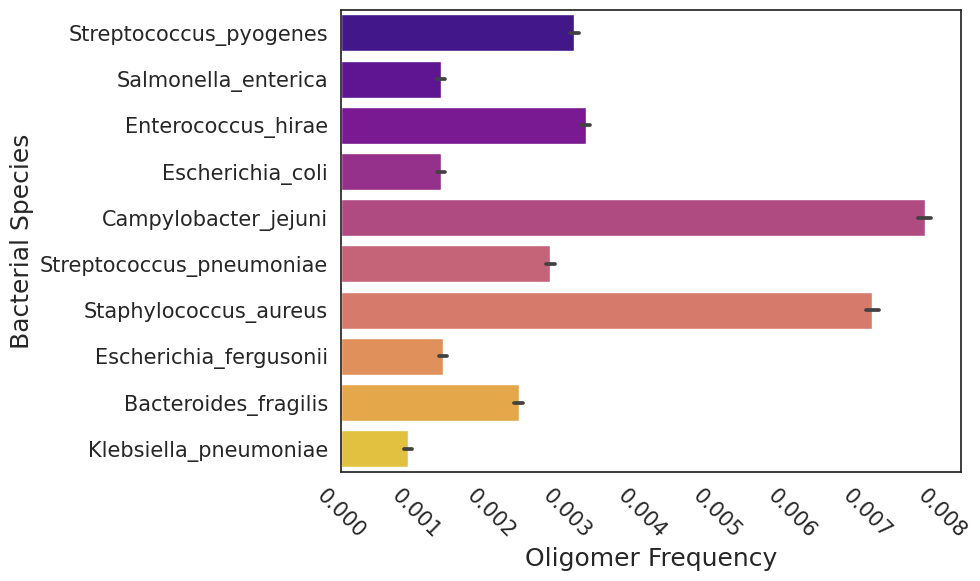

In [32]:
# A5T4G0C1 bacterial species composition
sns.set_context("notebook", font_scale=1.5)
sns.set_style("white")
sns.set_color_codes(palette='deep')
f, ax = plt.subplots(figsize=(8, 6))
sns.barplot(x = "A5T4G0C1", y = "target", palette= 'plasma', data = tdf)
plt.tick_params(axis='x', labelsize=15, rotation=-45)
plt.tick_params(axis='y', labelsize=15, rotation=0)
plt.xlabel("Oligomer Frequency")
plt.ylabel("Bacterial Species")

## Skeweness of Numeric data

In [33]:
train_labels = tdf['target'].reset_index(drop=True)
# drop sales price variable; axis=1 drops column not row
train_features = tdf.drop(['target'], axis=1)
test_features = tsdf

# combine train and test datasets
all_features = pd.concat([train_features, test_features]).reset_index(drop=True)
# describe
all_features.shape

# get numeric data
# set the numeric datatypes
numeric_dtypes = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
# save potential values (i) in numeric dictionary if dtype is numeric
numeric = []
for i in all_features.columns:
    if all_features[i].dtype in numeric_dtypes:
        numeric.append(i)
        
# check the skew of all numerical features with skew function
# lower skew is better. If we get high scores, we can transform data to make the data distribution more normal
skew_features = all_features[numeric].apply(lambda x: skew(x)).sort_values(ascending=False)

# set values with a high skew as being above > 0.5, create dictionary
high_skew = skew_features[skew_features > 0.5]
skew_index = high_skew.index

# count how many variables have high skew
print("There are {} variables with a skew > 0.5 :".format(high_skew.shape[0]))

There are 273 variables with a skew > 0.5 :


In [34]:
# set dataframe for values with high skew
skewness = pd.DataFrame({'Skew' :high_skew})
# show values
skew_features.head(30)

A1T0G0C9     234.627800
A0T10G0C0    185.889868
A0T0G9C1     175.515298
A0T1G9C0     174.074024
A0T0G0C10    132.517654
A0T0G10C0    106.782249
A1T0G9C0     104.729469
A0T0G1C9      82.511916
A2T0G0C8      74.460405
A0T2G0C8      71.344262
A10T0G0C0     68.962798
A1T1G8C0      67.777575
A0T1G1C8      64.127829
A0T2G8C0      62.334112
A2T0G8C0      61.282658
A0T0G8C2      59.808825
A1T0G8C1      59.546702
A1T1G0C8      52.705638
A0T1G8C1      47.814663
A0T0G2C8      43.038804
A3T0G0C7      34.388467
A3T0G7C0      34.344323
A0T3G7C0      31.357236
A0T3G0C7      30.006472
A0T9G1C0      27.490738
A0T2G1C7      23.540211
A9T0G0C1      23.423230
A1T2G0C7      22.114388
A2T1G0C7      21.970395
A0T0G7C3      21.178010
dtype: float64

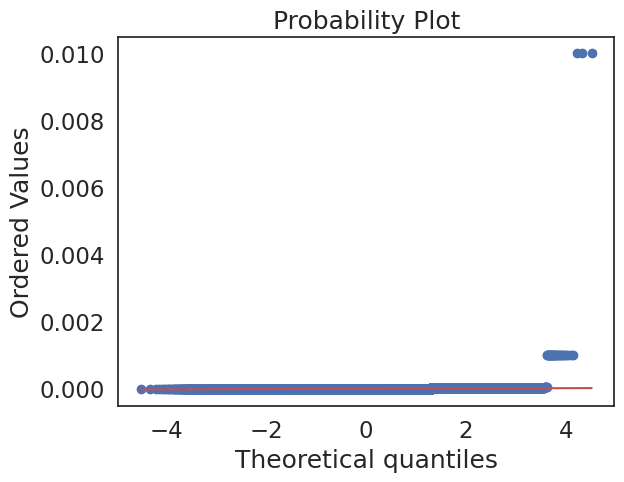

In [35]:
fig = plt.figure()
res = stats.probplot(all_features['A1T0G0C9'], plot=plt)
plt.show()


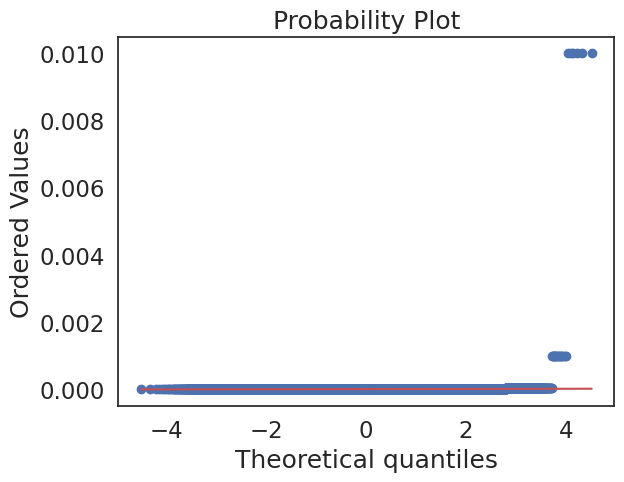

In [36]:
fig = plt.figure()
res = stats.probplot(all_features['A0T10G0C0'], plot=plt)
plt.show()

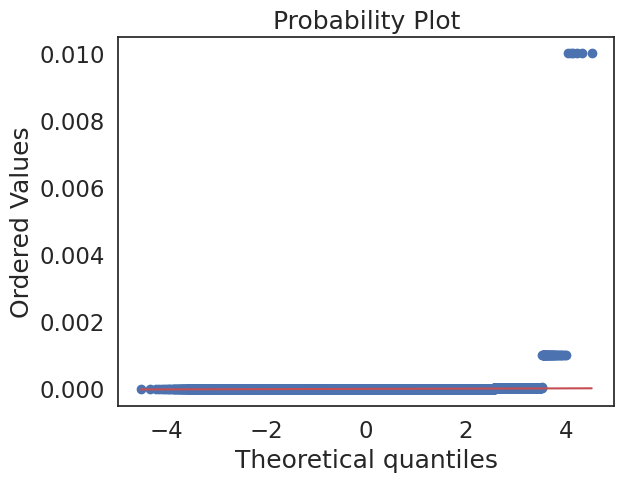

In [37]:
fig = plt.figure()
res = stats.probplot(all_features['A0T0G9C1'], plot=plt)
plt.show()

In [38]:
skew_cols = tdf.select_dtypes(exclude='object').skew().sort_values(ascending=False)
skew_cols = pd.DataFrame(skew_features.loc[skew_features > 0.75]).rename(columns={0:'Skew before'})

# Box-cox transformation
t=tdf.copy()
for i in skew_cols.index.tolist():
    t[i] = boxcox1p(t[i], boxcox_normmax(t[i] + 1))
    
skew_df=pd.concat([skew_cols, t[skew_cols.index].skew()], axis=1).rename(columns={0:'After'})
skew_df.head(30)

,Skew before,After
A1T0G0C9,234.627800,1.172240
A0T10G0C0,185.889868,1.784649
A0T0G9C1,175.515298,1.034871
A0T1G9C0,174.074024,0.970950
A0T0G0C10,132.517654,1.711132
A0T0G10C0,106.782249,3.813840
A1T0G9C0,104.729469,0.333303
A0T0G1C9,82.511916,0.533790
A2T0G0C8,74.460405,0.164961
A0T2G0C8,71.344262,0.160057


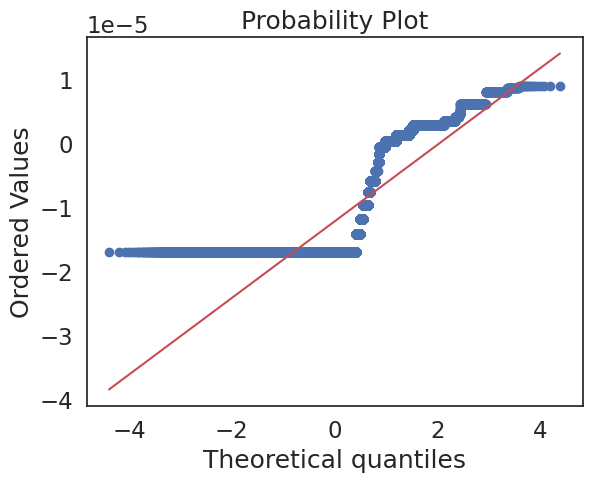

In [39]:
fig = plt.figure()
res = stats.probplot(t['A1T0G0C9'], plot=plt)
plt.show()

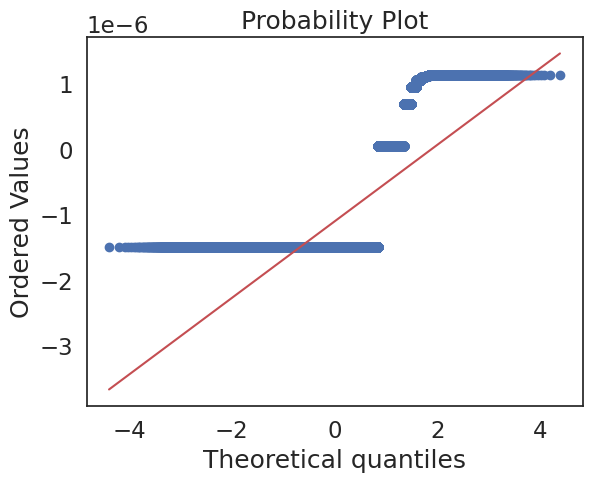

In [40]:
fig = plt.figure()
res = stats.probplot(t['A0T10G0C0'], plot=plt)
plt.show()

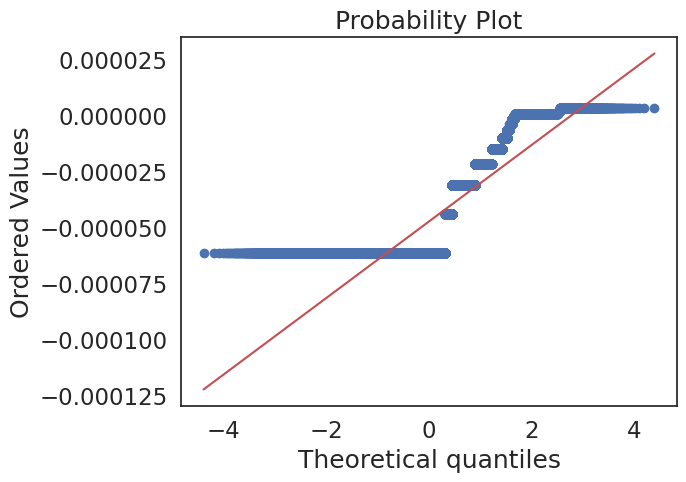

In [41]:
fig = plt.figure()
res = stats.probplot(t['A0T0G9C1'], plot=plt)
plt.show()

In [42]:
X=t.drop('target', axis=1)

# Principal components Analysis 

### 1- Standrize the data 

In [43]:
X_mean = np.mean(X, axis=0)
 
X_std = np.std(X, axis=0)
 
# Standardization
Z = (X - X_mean) / X_std
Z.head()

,A0T0G0C10,A0T0G1C9,A0T0G2C8,A0T0G3C7,A0T0G4C6,A0T0G5C5,A0T0G6C4,A0T0G7C3,A0T0G8C2,A0T0G9C1,...,A8T0G0C2,A8T0G1C1,A8T0G2C0,A8T1G0C1,A8T1G1C0,A8T2G0C0,A9T0G0C1,A9T0G1C0,A9T1G0C0,A10T0G0C0
row_id,,,,,,,,,,,,,,,,,,,,,
0,-0.495722,-0.943948,-1.085974,-1.086116,-1.087127,-1.100883,-1.077538,-1.064149,-0.828196,-0.705777,...,-1.336227,-1.326001,-1.288439,-1.394586,-1.293481,-1.258969,-1.160278,-1.198517,-1.191794,-0.667452
1,-0.495722,-0.943948,-1.085974,1.984530,-1.087127,1.785856,-1.077538,-1.064149,-0.828196,-0.705777,...,-1.336227,-1.326001,-1.288439,1.292258,1.084510,-1.258969,-1.160278,-1.198517,-1.191794,-0.667452
2,-0.495722,0.456827,0.972096,1.372870,1.432576,1.305929,1.447124,1.319984,1.350236,1.264377,...,-0.226753,-0.428626,-0.549449,-0.598127,-0.560629,-0.443091,-0.297580,-0.561428,-0.411859,1.526658
3,1.492228,-0.165067,1.114252,1.702825,1.701701,1.639757,1.642418,1.591763,1.223470,1.264377,...,0.035771,-0.145799,-0.205333,-0.218808,-0.259557,-0.008138,0.063325,-0.354375,0.132429,-0.667452
4,-0.495722,-0.943948,-1.085974,-1.086116,-1.087127,-1.100883,-1.077538,-1.064149,-0.828196,-0.705777,...,-1.336227,-1.326001,-1.288439,-1.394586,-1.293481,-1.258969,-1.160278,-1.198517,-1.191794,-0.667452


### 2-Covariance Matrix calculation 

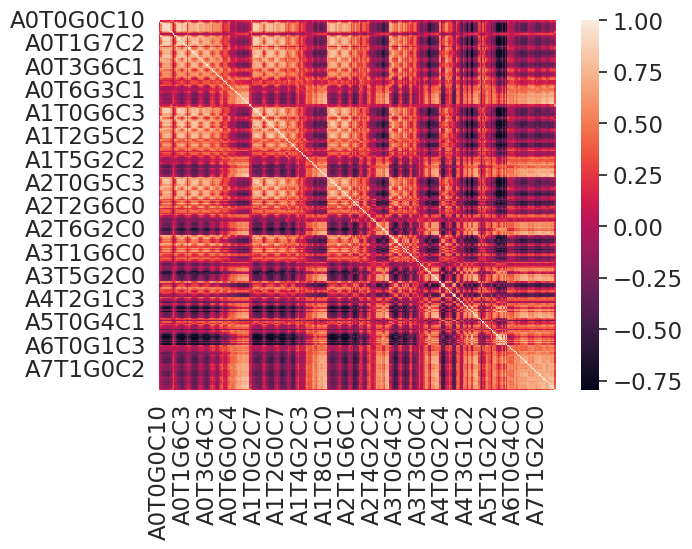

In [44]:
c = Z.cov()
sns.heatmap(c)
plt.show()

### 3-Now we will compute the eigenvectors and eigenvalues for our feature space


In [45]:
eigenvalues, eigenvectors = np.linalg.eig(c)
print('Eigen values:\n', eigenvalues)
print('Eigen values Shape:', eigenvalues.shape)
print('Eigen Vector Shape:', eigenvectors.shape)

Eigen values:
 [9.12630358e+01 5.84023840e+01 1.17568872e+01 9.64673748e+00
 6.23819644e+00 5.68110348e+00 3.36358093e+00 2.95152122e+00
 2.27463526e+00 2.08890793e+00 1.74736874e+00 1.56755195e+00
 1.24732473e+00 1.08093151e+00 1.01331792e+00 8.47972345e-01
 8.11149399e-01 7.80180206e-01 7.68013262e-01 7.53198477e-01
 7.29263989e-01 7.25911563e-01 7.13901487e-01 7.04556590e-01
 6.99454573e-01 6.84822023e-01 6.73326361e-01 6.71904620e-01
 6.60545725e-01 6.57608951e-01 6.52295231e-01 6.44257731e-01
 6.30259345e-01 6.27757763e-01 6.18634887e-01 6.12017687e-01
 6.10750479e-01 6.05529903e-01 5.94816519e-01 6.00183079e-01
 5.85604456e-01 5.77115284e-01 5.70835211e-01 5.61396527e-01
 5.63898683e-01 5.52885898e-01 5.50393088e-01 5.45019356e-01
 5.39747727e-01 5.38863630e-01 5.31121750e-01 5.28242097e-01
 5.22653491e-01 5.18657727e-01 5.14864637e-01 5.13119749e-01
 5.07392135e-01 5.02723642e-01 5.02342534e-01 4.99012164e-01
 4.91834264e-01 4.89804524e-01 4.90493772e-01 4.86755434e-01
 4.788569

### 4 - Sorting the eignvalues & eignvectors 

In [46]:
# Index the eigenvalues in descending order 
idx = eigenvalues.argsort()[::-1]
 
# Sort the eigenvalues in descending order 
eigenvalues = eigenvalues[idx]
 
# sort the corresponding eigenvectors accordingly
eigenvectors = eigenvectors[:,idx]

## Step 5: Transform Data using eigen vectors


### Now, we will take the dot product of our data with the eigen vectors to get projections of our data in the direction of these eigen vectors.

In [47]:
pca_data = np.dot( eigenvectors.transpose() , Z.transpose() ).transpose()
 

In [48]:
print(pca_data)

[[ 1.68975963e+00  2.28024667e+01 -9.12518175e+00 ... -7.74635326e-02
  -4.19384943e-02 -2.95063787e-02]
 [-5.10688536e+00  9.06453209e+00  9.88907421e+00 ... -3.12697968e-01
   6.61824274e-01 -1.61917483e+00]
 [-1.02560262e+01 -2.47702228e+00 -9.71158434e-01 ... -3.80694148e-02
   5.30182547e-02 -5.12872253e-02]
 ...
 [ 3.53465156e-01 -5.47562285e+00 -1.19062370e+00 ... -1.57693474e-02
  -5.97743021e-02  7.21617577e-02]
 [-1.00839094e+01 -2.15220893e+00  2.48407983e-02 ... -2.41770452e-01
   8.98514961e-02  7.76828312e-02]
 [-5.23821407e+00 -4.05636825e+00 -2.92983957e+00 ... -8.84345133e-02
   2.80292387e-02 -2.76444269e-02]]


In [49]:
pca = PCA(n_components=10).fit_transform(Z)
pca_df=pd.DataFrame(data=pca, columns=['PC'+str(i+1) for i in range(0,10)]).reset_index(drop=True)
species=tdf.target.reset_index(drop=True).str.replace('_', ' ') 
pca_df=pd.concat([species, pca_df], axis=1)
pca_df['map'] = pca_df['target'].map(pca_df['target'].value_counts())
pca_df = pca_df.sort_values(by='map', ascending=False).drop('map', axis=1)

pal = sns.color_palette("plasma", 12).as_hex()[:10]
fig = px.scatter(pca_df, x='PC1', y='PC2', color='target', color_discrete_sequence=pal, opacity=0.4)

fig.show()

#### To interprete this figure, we can see the bacterial oligomer score vectors graphed on 2 Principal Component axes

# Feature Selection 

In [50]:
gene_features = tdf.iloc[:,:-1]
target_species = tdf.iloc[:,-1:]

In [51]:
gene_features.shape

(123993, 286)

In [52]:
target_species.shape

(123993, 1)

In [53]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoders
gene_feature_encoder = LabelEncoder()
target_species_encoder = LabelEncoder()

# Assuming gene_features and target_species are pandas DataFrames

# Convert DataFrame columns to 1-dimensional arrays
gene_features_flat = gene_features.values.flatten()
target_species_flat = target_species.values.flatten()

# Encode the features and target species
gene_features_encoded = gene_feature_encoder.fit_transform(gene_features_flat)
target_species_encoded = target_species_encoder.fit_transform(target_species_flat)

# Reshape gene_features_encoded to original shape
gene_features_encoded = gene_features_encoded.reshape(gene_features.shape)


In [54]:
# Assuming gene_features_encoded.shape[1] gives the number of features
column_names = [f'feature_{i}' for i in range(gene_features_encoded.shape[1])]  # Access number of features
df = pd.DataFrame(gene_features_encoded, columns=column_names)
df['target'] = target_species_encoded


In [55]:
print("Original Dataset:") 
print(df.head()) 

Original Dataset:
   feature_0  feature_1  feature_2  feature_3  feature_4  feature_5  \
0      77476      77303      76669      75409      74037      73434   
1      77476      77303      76669      94846      74037      92522   
2      77476      77463      77645      80087      82872      82909   
3      77497      77383      77750      82407      87352      87949   
4      77476      77303      76669      75409      74037      73434   

   feature_6  feature_7  feature_8  feature_9  ...  feature_277  feature_278  \
0      74037      75409      76669      77303  ...        75895        76669   
1      74037      75409      76669      77303  ...        75895        76669   
2      82372      80007      77519      77363  ...        79198        78476   
3      85432      81447      77436      77363  ...        80538        79517   
4      74037      75409      76669      77303  ...        75895        76669   

   feature_279  feature_280  feature_281  feature_282  feature_283  \
0   

In [56]:
k = 100
chi2_selector = SelectKBest(chi2, k=k) 
X_new = chi2_selector.fit_transform(gene_features_encoded, target_species_encoded) 
  

In [57]:
selected_features = df.columns[:-1][chi2_selector.get_support()] 
print("\nSelected Features:") 
print(selected_features)


Selected Features:
Index(['feature_15', 'feature_16', 'feature_24', 'feature_25', 'feature_26',
       'feature_33', 'feature_34', 'feature_41', 'feature_70', 'feature_71',
       'feature_78', 'feature_79', 'feature_80', 'feature_81', 'feature_82',
       'feature_87', 'feature_88', 'feature_89', 'feature_90', 'feature_95',
       'feature_96', 'feature_97', 'feature_102', 'feature_103', 'feature_112',
       'feature_113', 'feature_124', 'feature_125', 'feature_126',
       'feature_132', 'feature_133', 'feature_134', 'feature_135',
       'feature_140', 'feature_141', 'feature_142', 'feature_147',
       'feature_148', 'feature_152', 'feature_153', 'feature_154',
       'feature_156', 'feature_157', 'feature_158', 'feature_159',
       'feature_160', 'feature_161', 'feature_162', 'feature_163',
       'feature_169', 'feature_170', 'feature_176', 'feature_177',
       'feature_178', 'feature_183', 'feature_184', 'feature_188',
       'feature_189', 'feature_190', 'feature_192', 'fea

In [58]:

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_new, target_species_encoded, test_size=0.2, random_state=42)

# Print the shape of X_train_selected and X_test_selected
print("Shape of X_train_selected:", X_train.shape)
print("Shape of X_test_selected:", X_test.shape)

Shape of X_train_selected: (99194, 100)
Shape of X_test_selected: (24799, 100)


## Logistic_Regression_FS

In [59]:
model = LogisticRegression()  
model.fit(X_train, y_train)

LogisticRegression()

In [60]:
predictions = model.predict(X_test)
accuracy = accuracy_score(y_test, predictions)
print("Accuracy:", accuracy)

Accuracy: 0.8352352917456349


### cross validation Kfold

In [61]:
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

In [62]:
cross_val_results1 = cross_val_score(model ,X_new, target_species_encoded, cv=kf)


In [63]:
cross_val_results1

array([0.83523529, 0.83721118, 0.83414654, 0.83680135, 0.83756755])

## Random_Forest_FS

In [64]:
rf = RandomForestClassifier(n_estimators=100, max_depth=5, random_state=42)

In [65]:
rf.fit(X_train, y_train)

RandomForestClassifier(max_depth=5, random_state=42)

In [66]:
rf1_predictions = rf.predict(X_test)


In [67]:
accuracy_rf = accuracy_score(y_test, rf1_predictions)
print("Accuracy:", accuracy_rf)

Accuracy: 0.7761200048389048


In [68]:
params = {
    'n_estimators': Integer(10, 500),
    'max_depth': Integer(1, 50),
    'min_samples_split': Integer(2, 20),
    'min_samples_leaf': Integer(1, 20)
}

In [69]:
opt = BayesSearchCV(rf, params, n_iter=32, cv=3, n_jobs=-1, random_state=42)
opt.fit(X_train, y_train)

BayesSearchCV(cv=3,
              estimator=RandomForestClassifier(max_depth=5, random_state=42),
              n_iter=32, n_jobs=-1, random_state=42,
              search_spaces={'max_depth': Integer(low=1, high=50, prior='uniform', transform='normalize'),
                             'min_samples_leaf': Integer(low=1, high=20, prior='uniform', transform='normalize'),
                             'min_samples_split': Integer(low=2, high=20, prior='uniform', transform='normalize'),
                             'n_estimators': Integer(low=10, high=500, prior='uniform', transform='normalize')})

In [70]:
print("Best parameters found: ", opt.best_params_)

# Predict and evaluate the model
y_pred = opt.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: ", accuracy)

Best parameters found:  OrderedDict([('max_depth', 37), ('min_samples_leaf', 1), ('min_samples_split', 2), ('n_estimators', 500)])
Accuracy:  0.9659260454050567


In [71]:
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test, rf1_predictions ,average='weighted')

# Print the results
print("Precision:", precision)
print("Recall:", recall)
print("F1-Score:", f1_score)

Precision: 0.8050623655099187
Recall: 0.7761200048389048
F1-Score: 0.7829267084702011


In [72]:
cm = confusion_matrix(y_test, rf1_predictions)
print(cm)


[[2080   30   68    3   29    0    0    9  170  129]
 [   0 2222   35    1    0    0    0   66   51   93]
 [  77   48 1618    1    6    0    0   45  513  194]
 [  51    1    9 1892  240   41   61    0  116   57]
 [  61    4    8  177 1961   22   40    0  125   52]
 [  10    0    3   51    7 2274   24    0   87   24]
 [  19    5    6  179  100  135 1867    2  111   57]
 [  81  124   37    0    3    0    0 1839  243  142]
 [  52   24  116    0    3    0    0   12 2048  230]
 [  28   23  104    0    7    0    0   25  845 1446]]


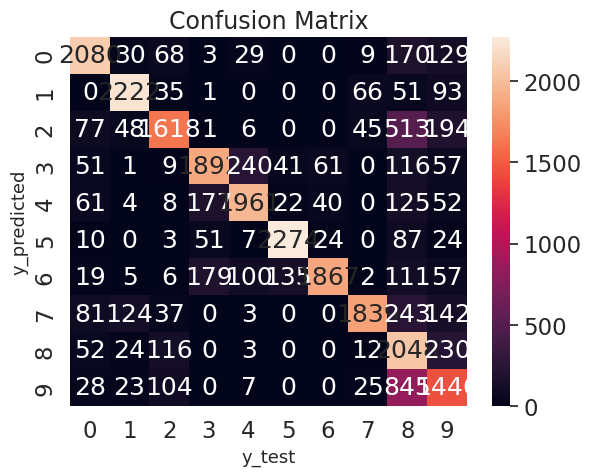

In [73]:
 sns.heatmap(cm,
            annot=True,
            fmt='g'
            )
plt.ylabel('y_predicted', fontsize=13)
plt.xlabel('y_test', fontsize=13)
plt.title('Confusion Matrix', fontsize=17)
plt.show()

## cross validation Kfold

In [74]:
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

In [75]:
cross_val_results2 = cross_val_score(rf,X_new, target_species_encoded, cv=kf)


In [76]:
cross_val_results2

array([0.77575709, 0.76914392, 0.77265212, 0.78586983, 0.77506251])

## Desicion_Tree_FS

In [77]:
clfs = DecisionTreeClassifier()

In [78]:
clfs.fit(X_train, y_train)

DecisionTreeClassifier()

In [79]:
dt_pres=clfs.predict(X_test)


In [80]:
dt_val_acc=accuracy_score(y_test, dt_pres)


In [81]:
dt_val_acc

0.8856808742287996

## cross validation Kfold

In [82]:
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

In [83]:
cross_val_results3 = cross_val_score(clfs,X_new, target_species_encoded, cv=kf)


In [84]:
cross_val_results3

array([0.88285818, 0.87902738, 0.87882576, 0.88124042, 0.88172433])

##  ExtraTreesClassifier_FS

In [85]:
from sklearn.ensemble import ExtraTreesClassifier

ext_FS=ExtraTreesClassifier(n_estimators=500,
                            class_weight='balanced',
                            random_state=92).fit(X_train, y_train)

In [86]:
ext_prds=ext_FS.predict(X_test)
y_probs=ext_FS.predict_proba(X_test)
ext_val_acc=accuracy_score(y_test, ext_prds)

In [87]:
ext_val_acc

0.9686277672486794

## cross validation Kfold

In [88]:
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

In [89]:
cross_val_results4 = cross_val_score(ext_FS,X_new, target_species_encoded, cv=kf)


In [90]:
cross_val_results4

array([0.96770031, 0.96697447, 0.96640994, 0.96858618, 0.96713445])

## Bagging_FS

In [91]:
bagging_clf_FS = BaggingClassifier(estimator=DecisionTreeClassifier(), n_estimators=10, random_state=42)

In [92]:
bagging_clf_FS.fit(X_train, y_train)

BaggingClassifier(estimator=DecisionTreeClassifier(), random_state=42)

In [93]:
bg_pr = bagging_clf_FS.predict(X_test)

In [94]:
bg_accuracy = accuracy_score(y_test, bg_pr)
print("Accuracy:", bg_accuracy)

Accuracy: 0.9212065002621074


In [95]:
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

In [96]:
cross_val_results6 = cross_val_score(bagging_clf_FS,X_new, target_species_encoded, cv=kf)


In [97]:
cross_val_results6

array([0.92197266, 0.92173071, 0.91531917, 0.9225744 , 0.9238245 ])

## VotingClassifier_FS

In [98]:
base_estimators = [
    ('decision_tree', DecisionTreeClassifier()),
    ('random_forest', RandomForestClassifier())
]

voting_classifier = VotingClassifier(estimators=base_estimators, voting='hard')


In [99]:
voting_classifier.fit(X_train, y_train)

VotingClassifier(estimators=[('decision_tree', DecisionTreeClassifier()),
                             ('random_forest', RandomForestClassifier())])

In [100]:
vp = voting_classifier.predict(X_test)
vot_accuracy = accuracy_score(y_test, vp)
print("Accuracy:", vot_accuracy)

Accuracy: 0.9231420621799266


In [101]:
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

In [102]:
cross_val_results7 = cross_val_score(voting_classifier,X_new, target_species_encoded, cv=kf)


In [103]:
cross_val_results7

array([0.92406952, 0.92189201, 0.91761765, 0.92317929, 0.92104202])

## Boosting_FS

In [104]:
base_estimator = DecisionTreeClassifier()  

In [105]:
adaboost_classifier = AdaBoostClassifier(estimator=base_estimator, n_estimators=50, random_state=42)

In [106]:
adaboost_classifier.fit(X_train, y_train)

AdaBoostClassifier(estimator=DecisionTreeClassifier(), random_state=42)

In [107]:
y_hat = adaboost_classifier.predict(X_test)
boo_accuracy = accuracy_score(y_test, y_hat)
print("Accuracy:", boo_accuracy)

Accuracy: 0.8828985039719344


In [108]:
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

In [109]:
cross_val_results8 = cross_val_score(adaboost_classifier,X_new, target_species_encoded, cv=kf)


In [110]:
cross_val_results8

array([0.8828985 , 0.87866446, 0.87842252, 0.88055488, 0.88124042])

## Stacking_FS

In [111]:
_estimators = [
    ('decision_tree', DecisionTreeClassifier(max_depth=1)),
    ('random_forest', RandomForestClassifier(n_estimators=10)),
    ('adaboost', AdaBoostClassifier(n_estimators=50))
]

stacking_classifier = StackingClassifier(estimators=_estimators, final_estimator=LogisticRegression())


In [112]:
stacking_classifier.fit(X_train, y_train)

StackingClassifier(estimators=[('decision_tree',
                                DecisionTreeClassifier(max_depth=1)),
                               ('random_forest',
                                RandomForestClassifier(n_estimators=10)),
                               ('adaboost', AdaBoostClassifier())],
                   final_estimator=LogisticRegression())

In [113]:
stk_pd = stacking_classifier.predict(X_test)

stk_accuracy = accuracy_score(y_test, stk_pd)
print("Accuracy:", stk_accuracy)

Accuracy: 0.9304004193717489


In [114]:
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)
cross_val_results9 = cross_val_score(stacking_classifier,X_new, target_species_encoded, cv=kf)
cross_val_results9

array([0.93306182, 0.92999718, 0.92898907, 0.93011533, 0.92947012])

#### We are concatenating both the train and test datasets to identify total categorical and continuous rows

## Feature Engineering 

In [115]:
FEATURES = [col for col in tdf.columns if col not in ['row_id', 'target']]
print(FEATURES)

['A0T0G0C10', 'A0T0G1C9', 'A0T0G2C8', 'A0T0G3C7', 'A0T0G4C6', 'A0T0G5C5', 'A0T0G6C4', 'A0T0G7C3', 'A0T0G8C2', 'A0T0G9C1', 'A0T0G10C0', 'A0T1G0C9', 'A0T1G1C8', 'A0T1G2C7', 'A0T1G3C6', 'A0T1G4C5', 'A0T1G5C4', 'A0T1G6C3', 'A0T1G7C2', 'A0T1G8C1', 'A0T1G9C0', 'A0T2G0C8', 'A0T2G1C7', 'A0T2G2C6', 'A0T2G3C5', 'A0T2G4C4', 'A0T2G5C3', 'A0T2G6C2', 'A0T2G7C1', 'A0T2G8C0', 'A0T3G0C7', 'A0T3G1C6', 'A0T3G2C5', 'A0T3G3C4', 'A0T3G4C3', 'A0T3G5C2', 'A0T3G6C1', 'A0T3G7C0', 'A0T4G0C6', 'A0T4G1C5', 'A0T4G2C4', 'A0T4G3C3', 'A0T4G4C2', 'A0T4G5C1', 'A0T4G6C0', 'A0T5G0C5', 'A0T5G1C4', 'A0T5G2C3', 'A0T5G3C2', 'A0T5G4C1', 'A0T5G5C0', 'A0T6G0C4', 'A0T6G1C3', 'A0T6G2C2', 'A0T6G3C1', 'A0T6G4C0', 'A0T7G0C3', 'A0T7G1C2', 'A0T7G2C1', 'A0T7G3C0', 'A0T8G0C2', 'A0T8G1C1', 'A0T8G2C0', 'A0T9G0C1', 'A0T9G1C0', 'A0T10G0C0', 'A1T0G0C9', 'A1T0G1C8', 'A1T0G2C7', 'A1T0G3C6', 'A1T0G4C5', 'A1T0G5C4', 'A1T0G6C3', 'A1T0G7C2', 'A1T0G8C1', 'A1T0G9C0', 'A1T1G0C8', 'A1T1G1C7', 'A1T1G2C6', 'A1T1G3C5', 'A1T1G4C4', 'A1T1G5C3', 'A1T1G6C2', 

In [116]:
df = pd.concat([tdf[FEATURES], tsdf[FEATURES]], axis=0)
cat_features = [col for col in FEATURES if df[col].nunique() < 25]
cont_features = [col for col in FEATURES if df[col].nunique() >= 25]

In [117]:
cat_features

['A0T0G0C10',
 'A0T0G1C9',
 'A0T0G9C1',
 'A0T0G10C0',
 'A0T1G0C9',
 'A0T10G0C0',
 'A1T0G9C0',
 'A10T0G0C0']

In [118]:
print(f" Total number of rows :",df.shape[0])
print(f" Number of categorical columns :",len(cat_features))
print(f" Number of continuous columns :",len(cont_features))

 Total number of rows : 223993
 Number of categorical columns : 8
 Number of continuous columns : 278


([<matplotlib.patches.Wedge at 0x7bc073fc2b00>,
 [Text(1.0957554580037052, 0.096540024109643, 'Categorical'),
  Text(-1.0957554625230688, -0.09653997281362785, 'Continuous')],
 [Text(0.5976847952747483, 0.05265819496889618, '3%'),
  Text(-0.5976847977398556, -0.05265816698925155, '97%')])

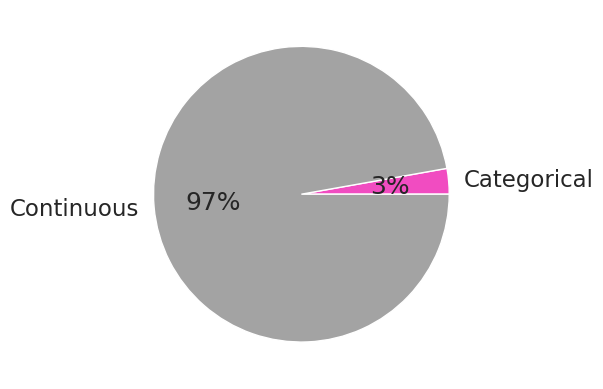

In [119]:
data = [len(cat_features),len(cont_features)]
labels = ['Categorical', 'Continuous']

x = ['Categorical', 'Continuous']
y = [len(cat_features),len(cont_features)]

colors = sns.color_palette('bright')[6:8]

plt.pie(data, labels = labels, colors = colors, autopct='%.0f%%')

<Axes: >

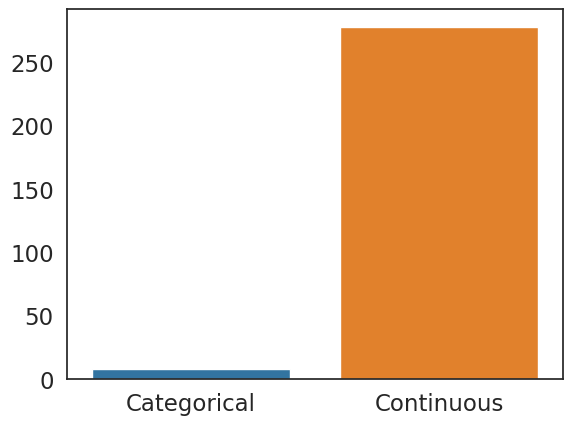

In [120]:
sns.barplot( y=data,x=labels)


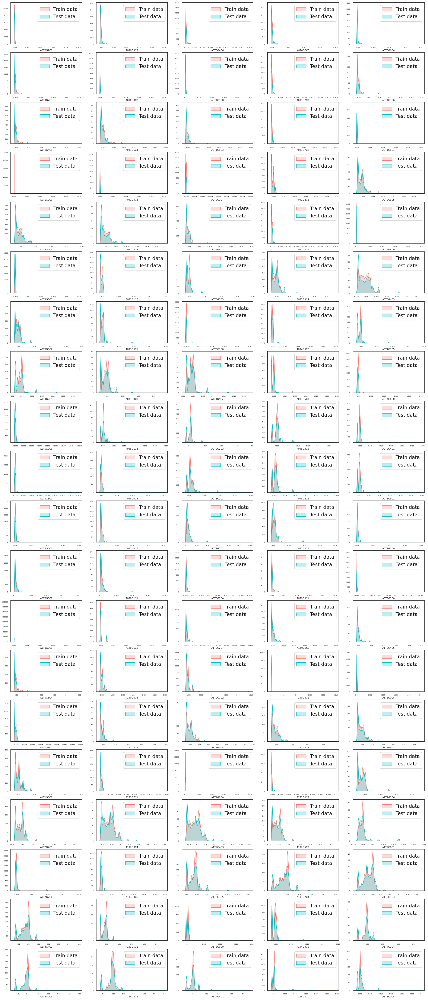

In [121]:
ncols = 5
nrows = 20
n_features = cont_features[:100]
fig, axes = plt.subplots(nrows, ncols, figsize=(25, 15*4))

for r in range(nrows):
    for c in range(ncols):
        col = n_features[r*ncols+c]
        sns.kdeplot(x=tdf[col], ax=axes[r, c], color='#F8766D', label='Train data' , fill =True )
        sns.kdeplot(x=tsdf[col], ax=axes[r, c], color='#00BFC4', label='Test data', fill =True)
        axes[r,c].legend()
        axes[r, c].set_ylabel('')
        axes[r, c].set_xlabel(col, fontsize=8)
        axes[r, c].tick_params(labelsize=5, width=0.5)
        axes[r, c].xaxis.offsetText.set_fontsize(6)
        axes[r, c].yaxis.offsetText.set_fontsize(4)
plt.show()

## Label Encoding 

In [122]:
cat_features

['A0T0G0C10',
 'A0T0G1C9',
 'A0T0G9C1',
 'A0T0G10C0',
 'A0T1G0C9',
 'A0T10G0C0',
 'A1T0G9C0',
 'A10T0G0C0']

In [123]:

categorical_columns = {"categorical": ['A0T0G0C10','A0T0G1C9','A0T0G9C1','A0T0G10C0','A0T1G0C9','A0T10G0C0','A1T0G9C0', 'A10T0G0C0']}
df = pd.DataFrame(categorical_columns)

le = LabelEncoder()

df["encoded_data"] = le.fit_transform(df["categorical"])

print(df)


  categorical  encoded_data
0   A0T0G0C10             0
1    A0T0G1C9             2
2    A0T0G9C1             3
3   A0T0G10C0             1
4    A0T1G0C9             5
5   A0T10G0C0             4
6    A1T0G9C0             7
7   A10T0G0C0             6


In [124]:
X = tdf.iloc[:,:-1]
y = tdf.iloc[:,-1:]

In [125]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, shuffle=True, 
                                                  stratify=y, random_state=21)

In [126]:
s = StandardScaler()

X_train_scaled = s.fit_transform(X_train)
X_val_scaled = s.transform(X_val)
X_test_scaled = s.transform(tsdf)

pca = PCA(n_components=100)
X_train_pca=pca.fit_transform(X_train_scaled)
X_val_pca=pca.transform(X_val_scaled)
X_test_pca=pca.transform(X_test_scaled)

print("Train Shape: {} {}".format(X_train_pca.shape, y_train.shape))
print("Validation Shape: {} {}".format(X_val_pca.shape, y_val.shape))
print("Test Shape: {}\n".format(X_test_pca.shape))

Train Shape: (99194, 100) (99194, 1)
Validation Shape: (24799, 100) (24799, 1)
Test Shape: (100000, 100)



In [127]:
et_pca = LogisticRegression()

In [128]:
et_pca.fit(X_train_pca, y_train)

LogisticRegression()

In [129]:
y_preds=et_pca.predict(X_val_pca)


In [130]:
y_probs=et_pca.predict_proba(X_val_pca)


In [131]:
val_acc=accuracy_score(y_true=y_val, y_pred=y_preds)


In [132]:
val_acc


0.8841082301705714

In [133]:
precision, recall, f1_score, _ = precision_recall_fscore_support(y_val, y_preds,average='weighted')

# Print the results
print("Precision:", precision)
print("Recall:", recall)
print("F1-Score:", f1_score)

Precision: 0.8858490750344025
Recall: 0.8841082301705714
F1-Score: 0.8843339881074274


In [134]:
cm = confusion_matrix(y_val, y_preds)
print(cm)


[[2294    8   29    8   33    3   13   17   66   34]
 [   5 2379   37    0    1    0    0   60    3    9]
 [ 151   15 2135    2    8    0    0   17   52   95]
 [  16    1    2 1964  327   28  104    1   10    6]
 [  19    4    3  162 2176   13   54    0   11   15]
 [   0    0    1   30    4 2268  179    0    2    0]
 [  12    3    0  253   46   79 2079    1    3    2]
 [  11   45   22    0    2    0    3 2371   10   19]
 [ 212    7   36    0    8    1    2   24 2121   72]
 [ 132    5   81    1    7    0    0   31   86 2138]]


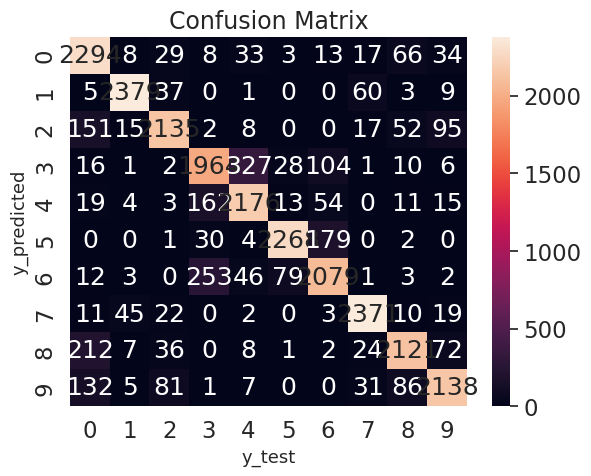

In [135]:
 sns.heatmap(cm,
            annot=True,
            fmt='g'
            )
plt.ylabel('y_predicted', fontsize=13)
plt.xlabel('y_test', fontsize=13)
plt.title('Confusion Matrix', fontsize=17)
plt.show()

### SVM 

In [136]:
model = SVC(kernel='linear', C=1.0)

In [137]:
model.fit(X_train_pca, y_train)

SVC(kernel='linear')

In [138]:
y_predictions=model.predict(X_val_pca)


In [139]:
y_predictions

array(['Campylobacter_jejuni', 'Streptococcus_pneumoniae',
       'Streptococcus_pyogenes', ..., 'Streptococcus_pyogenes',
       'Staphylococcus_aureus', 'Campylobacter_jejuni'], dtype=object)

In [140]:
val_acc=accuracy_score(y_true=y_val, y_pred=y_predictions)


In [141]:
val_acc

0.8868502762208154

In [142]:
precision, recall, f1_score, _ = precision_recall_fscore_support(y_val, y_predictions,average='weighted')

# Print the results
print("Precision:", precision)
print("Recall:", recall)
print("F1-Score:", f1_score)

Precision: 0.8891412468014256
Recall: 0.8868502762208154
F1-Score: 0.8868126788822318


In [143]:
cm = confusion_matrix(y_val, y_predictions)
print(cm)


[[2348    6   30    7   17    0    3   11   58   25]
 [   9 2388   25    0    0    0    0   61    2    9]
 [ 170   18 2130    0    3    0    0   20   49   85]
 [  16    0    2 1954  365   22   92    1    4    3]
 [  15    4    3  168 2206   10   44    0    2    5]
 [   0    1    1   21    5 2408   48    0    0    0]
 [   9    3    1  278   44   69 2068    1    3    2]
 [  20   45   20    0    0    0    0 2372    7   19]
 [ 323   10   36    1    6    0    0   22 2009   76]
 [  52   13   85    0    1    0    0   29  191 2110]]


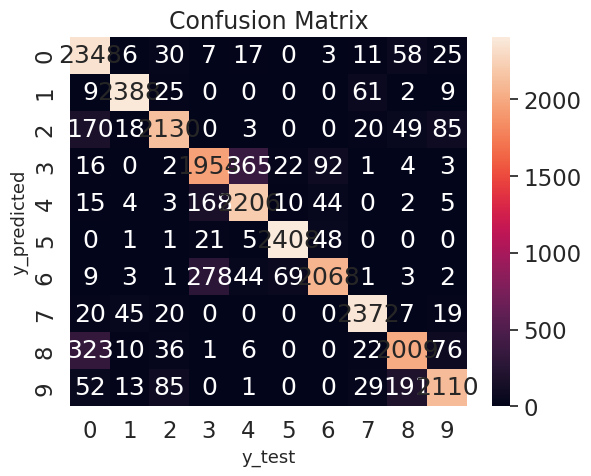

In [144]:
 sns.heatmap(cm,
            annot=True,
            fmt='g'
            )
plt.ylabel('y_predicted', fontsize=13)
plt.xlabel('y_test', fontsize=13)
plt.title('Confusion Matrix', fontsize=17)
plt.show()

### Decision Tree 

In [145]:
clf2 = DecisionTreeClassifier()

In [146]:
clf2.fit(X_train_pca, y_train)

DecisionTreeClassifier()

In [147]:
y_predi=clf2.predict(X_val_pca)


In [148]:
y_predi

array(['Campylobacter_jejuni', 'Streptococcus_pneumoniae',
       'Streptococcus_pyogenes', ..., 'Streptococcus_pyogenes',
       'Staphylococcus_aureus', 'Campylobacter_jejuni'], dtype=object)

In [149]:
val_acc=accuracy_score(y_true=y_val, y_pred=y_predi)


In [150]:
val_acc

0.9063268680188717

In [151]:
precision, recall, f1_score, _ = precision_recall_fscore_support(y_val, y_predi ,average='weighted')

# Print the results
print("Precision:", precision)
print("Recall:", recall)
print("F1-Score:", f1_score)

Precision: 0.906308174916045
Recall: 0.9063268680188717
F1-Score: 0.9063053556031364


In [152]:
cm = confusion_matrix(y_val, y_predi)
print(cm)


[[2318    4   29   16   23    2    9    4   75   25]
 [   4 2349   30    0    0    1    1   90    9   10]
 [  22   24 2211    3    6    1    0   32   68  108]
 [  21    2    4 2160  133   24  107    1    3    4]
 [  31    5    6  143 2164   26   64    3   10    5]
 [   0    1    0   26   18 2384   54    0    1    0]
 [   9    2    4  115   77   48 2216    4    1    2]
 [   8   80   44    0    2    0    0 2315   11   23]
 [  77   11   67    7    8    2    1   14 2171  125]
 [  36   16  102    5    5    1    2   24  102 2188]]


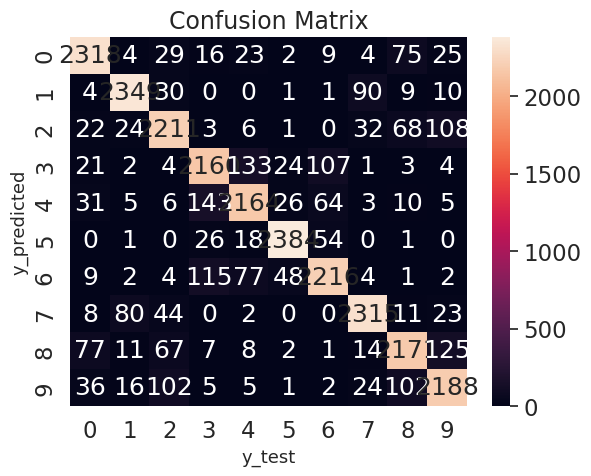

In [153]:
 sns.heatmap(cm,
            annot=True,
            fmt='g'
            )
plt.ylabel('y_predicted', fontsize=13)
plt.xlabel('y_test', fontsize=13)
plt.title('Confusion Matrix', fontsize=17)
plt.show()

In [154]:
from sklearn.ensemble import ExtraTreesClassifier

ext_pca=ExtraTreesClassifier(n_estimators=500,
                            class_weight='balanced',
                            random_state=92).fit(X_train_pca, y_train)

In [155]:
preds=ext_pca.predict(X_val_pca)
y_probs=ext_pca.predict_proba(X_val_pca)
val_acc=accuracy_score(y_true=y_val, y_pred=preds)

In [156]:
val_acc

0.9604016290979475

In [157]:
precision, recall, f1_score, _ = precision_recall_fscore_support(y_val, preds ,average='weighted')

# Print the results
print("Precision:", precision)
print("Recall:", recall)
print("F1-Score:", f1_score)

Precision: 0.9605511369178996
Recall: 0.9604016290979475
F1-Score: 0.9604147098073921


In [158]:
cm = confusion_matrix(y_val, preds)
print(cm)


[[2438    1    4   13    9    1    3    8   18   10]
 [   2 2428    4    0    2    1    1   49    4    3]
 [  22   10 2346    3    2    0    3   25   23   41]
 [  14    1    2 2337   56   11   34    1    1    2]
 [  13    1    5   59 2333    7   27    1    8    3]
 [   1    0    0   17   15 2429   21    0    1    0]
 [   8    3    3   44   38   21 2354    2    3    2]
 [   8   27    6    0    2    0    0 2422    6   12]
 [  40    3   10    3    5    0    2   16 2368   36]
 [  11    1   23    2    2    0    0   35   45 2362]]


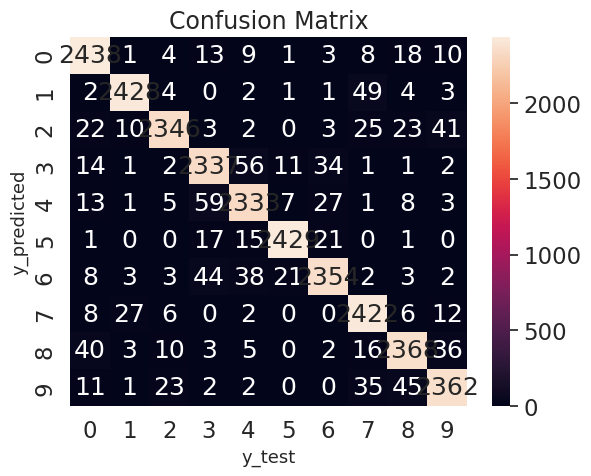

In [159]:
 sns.heatmap(cm,
            annot=True,
            fmt='g'
            )
plt.ylabel('y_predicted', fontsize=13)
plt.xlabel('y_test', fontsize=13)
plt.title('Confusion Matrix', fontsize=17)
plt.show()

### Random Forest 


In [160]:
rf_pca=RandomForestClassifier()

In [161]:
rf_pca.fit(X_train_pca, y_train)

RandomForestClassifier()

In [162]:
rf_pred=rf_pca.predict(X_val_pca)

In [163]:
rf_pred

array(['Campylobacter_jejuni', 'Streptococcus_pneumoniae',
       'Streptococcus_pyogenes', ..., 'Streptococcus_pyogenes',
       'Staphylococcus_aureus', 'Campylobacter_jejuni'], dtype=object)

In [164]:
val_acc=accuracy_score(y_true=y_val, y_pred=rf_pred)

In [165]:
val_acc

0.9470543167063188

In [166]:
precision, recall, f1_score, _ = precision_recall_fscore_support(y_val, rf_pred ,average='weighted')

# Print the results
print("Precision:", precision)
print("Recall:", recall)
print("F1-Score:", f1_score)

Precision: 0.9470928875521377
Recall: 0.9470543167063188
F1-Score: 0.94702380170305


In [167]:
cm = confusion_matrix(y_val, rf_pred)
print(cm)


[[2405    6   12    9    8    2    4   11   29   19]
 [   6 2409   13    0    0    0    0   55    0   11]
 [  31   15 2319    0    2    0    3   23   33   49]
 [   8    4    3 2297   70   20   50    2    3    2]
 [  25    2    7   82 2290   11   27    2    4    7]
 [   2    0    0   19   20 2419   24    0    0    0]
 [  12    5    4   47   56   32 2313    5    1    3]
 [   5   46   13    0    1    0    0 2402    7    9]
 [  45    5   33    1    8    0    2   19 2322   48]
 [  16    8   53    1    2    0    0   39   52 2310]]


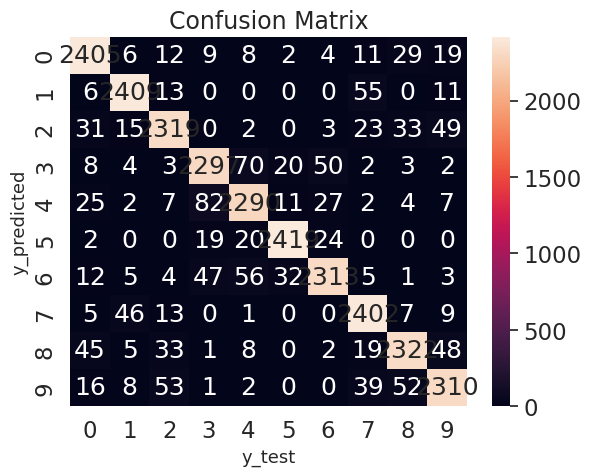

In [168]:
 sns.heatmap(cm,
            annot=True,
            fmt='g'
            )
plt.ylabel('y_predicted', fontsize=13)
plt.xlabel('y_test', fontsize=13)
plt.title('Confusion Matrix', fontsize=17)
plt.show()

# Bagging_pca

In [169]:
base_classifier = DecisionTreeClassifier() 

bagging_classifier = BaggingClassifier(estimator=base_classifier, n_estimators=10, random_state=42)



In [170]:
# Train the BaggingClassifier
bagging_classifier.fit(X_train_pca, y_train)



BaggingClassifier(estimator=DecisionTreeClassifier(), random_state=42)

In [171]:
y_hatt = bagging_classifier.predict(X_val_pca)

# Calculate accuracy
accuracy = accuracy_score(y_val, y_hatt)
print("Accuracy:", accuracy)

Accuracy: 0.9250776240977459


## VotingClassifier_pca

In [172]:
base_estim = [
    ('decision_tree', DecisionTreeClassifier()),
    ('random_forest', RandomForestClassifier())
]

voting_classifier = VotingClassifier(estimators=base_estim, voting='hard')



In [173]:
voting_classifier.fit(X_train_pca, y_train)

VotingClassifier(estimators=[('decision_tree', DecisionTreeClassifier()),
                             ('random_forest', RandomForestClassifier())])

In [174]:
y_pe = voting_classifier.predict(X_val_pca)

accuracy = accuracy_score(y_val, y_pe)
print("Accuracy:", accuracy)

Accuracy: 0.9248760030646397


## Boosting_pca

### Adaboost

In [175]:
base_est = DecisionTreeClassifier()  

adaboost_classifier = AdaBoostClassifier(estimator=base_est, n_estimators=50, random_state=42)


In [176]:
adaboost_classifier.fit(X_train_pca, y_train)

AdaBoostClassifier(estimator=DecisionTreeClassifier(), random_state=42)

In [177]:
y_pred_ada = adaboost_classifier.predict(X_val_pca)


accuracy = accuracy_score(y_val, y_pred_ada)
print("Accuracy:", accuracy)

Accuracy: 0.9058026533327956


In [178]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split


from xgboost import XGBClassifier
import lightgbm
from lightgbm import LGBMClassifier

In [179]:
model_lgb = LGBMClassifier()
model_lgb.fit(X_train_pca, y_train)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.135665 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 25500
[LightGBM] [Info] Number of data points in the train set: 99194, number of used features: 100
[LightGBM] [Info] Start training from score -2.292794
[LightGBM] [Info] Start training from score -2.296996
[LightGBM] [Info] Start training from score -2.304745
[LightGBM] [Info] Start training from score -2.310825
[LightGBM] [Info] Start training from score -2.311842
[LightGBM] [Info] Start training from score -2.300913
[LightGBM] [Info] Start training from score -2.303331
[LightGBM] [Info] Start training from score -2.301316
[LightGBM] [Info] Start training from score -2.301215
[LightGBM] [Info] Start training from score -2.302021


LGBMClassifier()

In [180]:
lg_pred=model.predict(X_val_pca)

In [181]:
lg_pred

array(['Campylobacter_jejuni', 'Streptococcus_pneumoniae',
       'Streptococcus_pyogenes', ..., 'Streptococcus_pyogenes',
       'Staphylococcus_aureus', 'Campylobacter_jejuni'], dtype=object)

In [182]:
print("Accuracy score : ",accuracy_score(y_val,lg_pred))

Accuracy score :  0.8868502762208154


## Stacking_pca

In [183]:
_ests = [
    ('decision_tree', DecisionTreeClassifier(max_depth=1)),
    ('random_forest', RandomForestClassifier(n_estimators=10)),
    ('adaboost', AdaBoostClassifier(n_estimators=50))
]

stacking_classifier = StackingClassifier(estimators=_ests, final_estimator=LogisticRegression())


In [184]:
stacking_classifier.fit(X_train_pca, y_train)

StackingClassifier(estimators=[('decision_tree',
                                DecisionTreeClassifier(max_depth=1)),
                               ('random_forest',
                                RandomForestClassifier(n_estimators=10)),
                               ('adaboost', AdaBoostClassifier())],
                   final_estimator=LogisticRegression())

In [185]:
y_pred_stack = stacking_classifier.predict(X_val_pca)


accuracy = accuracy_score(y_val, y_pred_stack)
print("Accuracy:", accuracy)

Accuracy: 0.9166095407072866
